# Sparse Identification of Nonlinear Dynamics (SINDy)

Two worked examples (step-by-step) for students.  
- **Example 1**: Van der Pol oscillator (simple, 2D)  
- **Example 2**: Forced Duffing oscillator (more complex, control/forcing)  

Each example contains short **TODO** parts where students fill a few lines.  
Run the cells in order. If `pysindy` is not installed, run the pip cell below first.

## Install required packages
Run this cell if you don't already have the packages installed.  
You might want to restart the kernel after installation.

In [1]:
!pip install --quiet pysindy numpy scipy matplotlib
# If the above fails in some environments, try: pip install pysindy numpy scipy matplotlib

## Imports
Standard imports we'll use throughout the notebook.

In [2]:
import numpy as np
import sympy as sp
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import pysindy as ps
np.random.seed(42)

-----------------------------
## Example 1 — Van der Pol oscillator (Simple)

Equation (2nd order):
$$x'' - \mu(1 - x^2) x' + x = 0$$
First-order form (let $x_1 = x$, $x_2 = x'$):
$$\begin{aligned}
x_1' &= x_2 \\
x_2' &= \mu(1-x_1^2) x_2 - x_1
\end{aligned}$$

We'll generate a trajectory, add noise, then use SINDy to discover the governing equations.

In [3]:
# Simulate Van der Pol
def van_der_pol(x, mu_):
    x1_, x2_ = x
    dx1 = x2_
    dx2 = mu_ * (1 - x1_**2) * x2_ - x1_
    return [dx1, dx2]

# TODO (students): choose mu, time span, dt, initial condition, and noise_std
mu = 2.0            # TODO: try other values (e.g., 1.0, 3.0)
t0, tf, dt = 0, 20, 0.01
t = np.arange(t0, tf, dt)
x0 = [2.0, 0.0]
noise_std = 0.05    # TODO: change noise level to see effect on discovery

sol = solve_ivp(lambda tt, xx: van_der_pol(xx, mu), (t0, tf), x0, t_eval=t, rtol=1e-10)
X = sol.y.T  # shape (n_steps, 2)
X_noisy = X + noise_std * np.random.randn(*X.shape)

print('Data shape:', X_noisy.shape)

Data shape: (2000, 2)


In [4]:
import matplotlib.animation as animation

fig, ax = plt.subplots()
ax.set_xlim(X[:,0].min()-1, X[:,0].max()+1)
ax.set_ylim(X[:,1].min()-1, X[:,1].max()+1)
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_title("Van der Pol Oscillator (Phase Portrait)")

line_true, = ax.plot([], [], lw=2, label="true (noise-free)")
line_noisy, = ax.plot([], [], '.', ms=2, alpha=0.5, label="noisy")
ax.legend()

def init():
    line_true.set_data([], [])
    line_noisy.set_data([], [])
    return line_true, line_noisy

def animate(i):
    line_true.set_data(X[:i,0], X[:i,1])
    line_noisy.set_data(X_noisy[:i,0], X_noisy[:i,1])
    return line_true, line_noisy

step = 5   # show every 5th frame
ani = animation.FuncAnimation(fig, animate, frames=range(0, len(t), step),
                              init_func=init, interval=30, blit=True)

plt.close(fig)  # prevent duplicate static plot
from IPython.display import HTML
HTML(ani.to_jshtml())

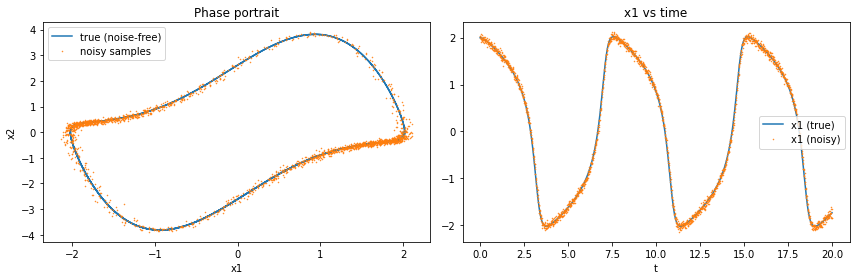

In [5]:
# Quick plots: phase portrait and time series
fig, axs = plt.subplots(1,2, figsize=(12,4))
axs[0].plot(X[:,0], X[:,1], label='true (noise-free)')
axs[0].plot(X_noisy[:,0], X_noisy[:,1], '.', markersize=1, label='noisy samples')
axs[0].set_xlabel('x1'); axs[0].set_ylabel('x2'); axs[0].legend(); axs[0].set_title('Phase portrait')

axs[1].plot(t, X[:,0], label='x1 (true)')
axs[1].plot(t, X_noisy[:,0], '.', markersize=1, label='x1 (noisy)')
axs[1].set_xlabel('t'); axs[1].set_title('x1 vs time'); axs[1].legend()
plt.tight_layout()


### Build and fit a SINDy model
We'll use a polynomial library and the Sequential Thresholded Least Squares (STLSQ) optimizer.
Fill the TODO lines to complete the model construction and fitting.

**RECALL:**
SINDy's optimization problem is given by: $\arg\min_{\boldsymbol{\Epsilon}} ||\dot{\mathbf{X}} - \boldsymbol{\Theta}(\mathbf{X})\boldsymbol{\Epsilon}||^2 + \lambda R(\boldsymbol{\Epsilon})$

Where:
 - $\dot{\mathbf{X}}$ is managed using $\texttt{pysindy.differentiation}$
 - $\boldsymbol{\Theta}(\mathbf{X})$ is managed using $\texttt{pysindy.feature_library}$
 - $\boldsymbol{\Epsilon}$ is managed using $\texttt{pysindy.optimizer}$

In [6]:
from pysindy.differentiation import FiniteDifference
from pysindy.feature_library import PolynomialLibrary
from pysindy.optimizers import STLSQ

# TODO: choose polynomial degree and STLSQ threshold
poly_degree = 3          # TODO: try 2 or 3
threshold = 0.1          # TODO: experiment with 0.01, 0.05, 0.2

library = PolynomialLibrary(degree=poly_degree)
optimizer = STLSQ(threshold=threshold)
differentiation_method = FiniteDifference()

model_vdp = ps.SINDy(feature_library=library, optimizer=optimizer, differentiation_method=differentiation_method)

# TODO: fit the model. Provide the noisy data X_noisy and time step dt
model_vdp.fit(X_noisy, t=dt)

print('Discovered equations for Van der Pol:')
model_vdp.print()


Discovered equations for Van der Pol:
(x0)' = 1.003 x1
(x1)' = -0.981 x0 + 1.966 x1 + -1.953 x0^2 x1


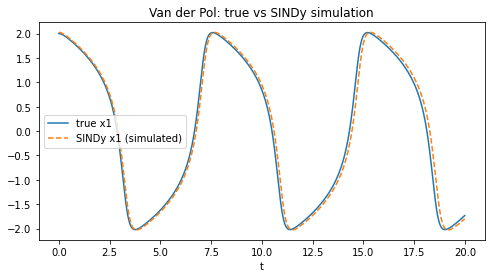

In [7]:
# Simulate the discovered model and compare
x0_sim = X_noisy[0]
t_sim = t
x_sim = model_vdp.simulate(x0_sim, t_sim)

plt.figure(figsize=(8,4))
plt.plot(t, X[:,0], label='true x1')
plt.plot(t, x_sim[:,0], '--', label='SINDy x1 (simulated)')
plt.xlabel('t'); plt.title('Van der Pol: true vs SINDy simulation'); plt.legend()


-----------------------------
## Example 2 — Forced Duffing oscillator (with forcing as input)

Equation (2nd order):
$$x'' + \delta x' + \alpha x + \beta x^3 = \gamma \cos(\omega t)$$
First-order form (let $x_1 = x$, $x_2 = x'$):
$$\begin{aligned}
x_1' &= x_2 \\
x_2' &= -\delta x_2 - \alpha x_1 - \beta x_1^3 + \gamma \cos(\omega t)
\end{aligned}$$

We will treat the forcing $u(t)=\cos(\omega t)$ as a known input to SINDy.

In [8]:
np.random.seed(1)
# Define forcing function
def forcing_func(tv, omega_):
    return np.cos(omega_ * tv)

# Simulate Forced Duffing
def duffing(t_, x, delta_, alpha_, beta_, gamma_, omega_):
    x1_, x2_ = x
    forcing = gamma_ * forcing_func(t_, omega_)
    dx1 = x2_
    dx2 = -delta_ * x2_ - alpha_ * x1_ - beta_ * x1_**3 + forcing
    return [dx1, dx2]

# TODO: choose parameters
delta = 0.2
alpha = -1.0
beta = 1.0
gamma = 0.3
omega = 1.2

t0, tf, dt = 0, 100, 0.05
t = np.arange(t0, tf, dt)
x0_init = [0.1, 0.0]

sol = solve_ivp(lambda tt, xx: duffing(tt, xx, delta, alpha, beta, gamma, omega), (t0, tf), x0_init, t_eval=t, rtol=1e-10)
X_duf = sol.y.T

#########################################################################
U = (forcing_func(t, omega)).reshape(-1,1)  # Forcing input u(t)

# Add some measurement noise
noise_std = 0.02
X_duf_noisy = X_duf + noise_std * np.random.randn(*X_duf.shape)

print('Duffing data shape:', X_duf_noisy.shape)

Duffing data shape: (2000, 2)


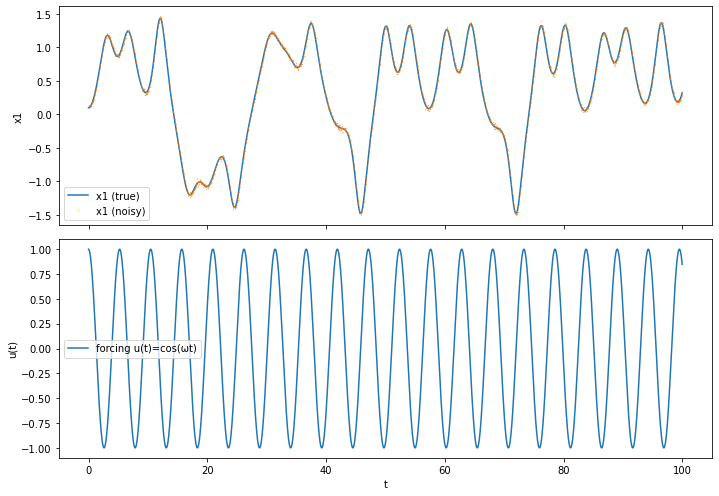

In [9]:
# Plot Duffing time series and forcing
fig, axs = plt.subplots(2,1, sharex=True, figsize=(10,7))
axs[0].plot(t, X_duf[:,0], label='x1 (true)')
axs[0].plot(t, X_duf_noisy[:,0], '.', markersize=0.5, label='x1 (noisy)')
axs[0].set_ylabel('x1'); axs[0].legend()

axs[1].plot(t, U[:,0], label='forcing u(t)=cos(ωt)')
axs[1].set_ylabel('u(t)'); axs[1].set_xlabel('t'); axs[1].legend()
plt.tight_layout()


### Fit SINDy with control input
We will create a library that includes polynomial features for the state and also identity features for the input (forcing).  
Fill the TODO lines to set thresholds and to call `fit` with the input `u=U`.

In [10]:
from pysindy.feature_library import IdentityLibrary, PolynomialLibrary, GeneralizedLibrary
from pysindy.optimizers import STLSQ
from pysindy.differentiation import FiniteDifference

# TODO: choose degree and threshold
poly_degree = 2
threshold = 0.05

state_library = PolynomialLibrary(degree=poly_degree)
input_library = IdentityLibrary()  # keep the forcing as-is so terms like u(t) appear
library = GeneralizedLibrary([state_library, input_library])

optimizer = STLSQ(threshold=threshold)
dz = FiniteDifference()

model_duf = ps.SINDy(feature_library=library, optimizer=optimizer, differentiation_method=dz)

# TODO: fit the model with the input: pass u=U
model_duf.fit(X_duf_noisy, t=dt, u=U)

print('Discovered equations (Duffing with forcing):')
model_duf.print()

Discovered equations (Duffing with forcing):
(x0)' = 0.500 x1 + 0.500 x1
(x1)' = 0.495 x0 + -0.099 x1 + 0.151 u0 + -0.987 x0^3 + 0.495 x0 + -0.099 x1 + 0.151 u0


In [11]:
##################################################
# Simplify the discovered equations automatically
##################################################
# Get discovered coefficients and feature names
coefs = model_duf.coefficients()
features = model_duf.get_feature_names()

def str_to_sym(expr_str):  # Reformat features so that they can be understood by SymPy
    s = expr_str.strip()
    s = s.replace('^', '**')    # caret -> python power
    s = s.replace(' ', '*')     # implicit multiplication (PySINDy often uses spaces)
    return sp.sympify(s)

# Build symbolic equations for each state derivative
eqs = []
for eq_idx in range(coefs.shape[0]):   # one equation per state variable
    expr = 0
    for c, f in zip(coefs[eq_idx], features):
        if abs(c) > 1e-6:  # ignore tiny coeffs
            if not f.isnumeric():
                expr += c * str_to_sym(f)
            else:
                expr += c * sp.sympify(f)
    eqs.append(sp.simplify(expr))

# Print simplified equations
print('Simplified discovered equations (Duffing with forcing):')
for i, e in enumerate(eqs):
    print(f"x{i}' =", sp.simplify(e))

Simplified discovered equations (Duffing with forcing):
x0' = 1.00040487230397*x1
x1' = 0.301748712948957*u0 - 0.986857690066631*x0**3 + 0.989154554342252*x0 - 0.198334429367396*x1


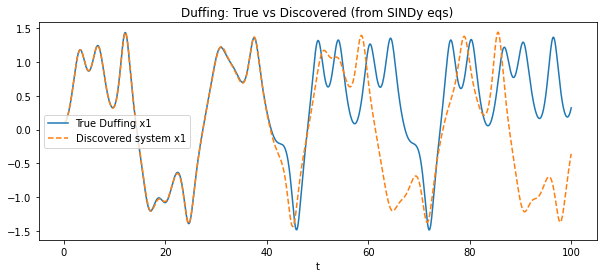

In [12]:
# Simulate the discovered Duffing model using the learned forcing term
# Define the variable symbols we used in "eqs"
x0, x1, u = sp.symbols('x0 x1 u0')

# Lambdify (i.e., make it behave as a function) each equation into a numpy function
rhs_funcs = [sp.lambdify((x0, x1, u), expr, 'numpy') for expr in eqs]

# Build the RHS system for solve_ivp
def rhs_discovered(tv, y):  # Right-Hand Side (RHS) of the differential equation
    u_val = forcing_func(tv, omega)
    dx = [rhs_f(y[0], y[1], u_val) for rhs_f in rhs_funcs]
    return dx

# Integrate discovered system (using same initial conditions as before)
sol_disc = solve_ivp(rhs_discovered, (t0, tf), x0_init, t_eval=t, rtol=1e-10)
X_disc = sol_disc.y.T

# Compare simulation with true Duffing
plt.figure(figsize=(10,4))
plt.plot(t, X_duf[:,0], label="True Duffing x1")
plt.plot(t, X_disc[:,0], '--', label="Discovered system x1")
plt.xlabel("t")
plt.title("Duffing: True vs Discovered (from SINDy eqs)")
plt.legend()
plt.show()

-----------------------------
## Exercises for students
1. For Van der Pol: experiment with `mu` and `noise_std`. How does noise affect the discovered terms?  
2. For Duffing: change `gamma` or `omega` and see whether SINDy captures the forcing term.  
3. Try different differentiation methods (e.g., SmoothedFiniteDifference) and different thresholds for STLSQ.  
4. Bonus: replace PolynomialLibrary with a library that contains sin/cos terms to capture periodic behavior more naturally.